In [3]:
import os
import sys
sys.path.insert(0, os.path.abspath('../'))

import settings as settings
from src.data import dataexplore as dtexp
from fbprophet import Prophet
from src.data import datacleaner as dtclean
from src.visualization import data_visualization as dtview
from src.data import make_dataset as make_ds
from src.data import dataframegenerator as gendf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from plotly.offline import init_notebook_mode, iplot
import warnings
import seaborn as sns

plt.style.use('ggplot')
sns.set_style('darkgrid', {'axes.facecolor': '.9'})
sns.set_palette(palette='deep')
sns_c = sns.color_palette(palette='deep')
%matplotlib inline
# OPTIONAL: Load the "autoreload" extension so that code can change
%load_ext autoreload

# OPTIONAL: always reload modules so that as you change code in src, it gets loaded
%autoreload 2

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

warnings.filterwarnings('ignore')
path, csvpath, imgpath, neg_values_path, large_file_path, model_path = settings.get_file_path()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Finding the most regular time series

###### As Forecast is an activity dependent on past events and Prophet make use of linear regression, to known past data will help to train Prophet's model make accurately predictions. Also, there are over 6 millions data collected from 121 retail stores each one on different locations, which affects the number of clients and products sales, so the first thing to do is define which store should be used to starts, as the datapoints may be distributed in a way that makes the prediction harder or easier.
###### The method choosed for this task is to use the Approximate Entropy (ApEn) as a measure of TS regularity, the lower the ApEn value, the more regular the time series is.

In [2]:
top_5, worst_5, df_apen = dtexp.get_most_regular_store(nof_store=5)

### Visualizing the top 5 best Approximate Entropy calculated:

In [3]:
df_apen.loc[df_apen['r'] == 0.2].groupby('ApEn').min().head(5)

,store,r,df_size
ApEn,,,
0.000002,4961,0.2,4000
0.019643,4955,0.2,4000
0.060363,4973,0.2,4000
0.071584,70,0.2,4000
0.121925,40,0.2,4000


### Visualizing the worst 5 Approximate Entropy calculated:

In [4]:
df_apen.loc[df_apen['r'] == 0.2].groupby('ApEn').min().tail(5)

,store,r,df_size
ApEn,,,
0.888051,4954,0.2,4000
0.888890,4971,0.2,4000
0.891149,4989,0.2,4000
0.892134,57,0.2,4000
0.910528,4956,0.2,4000


In [4]:
df = make_ds.get_dataset(table='sisqual_all'
                             , columns=['store', 'ds', 'sales']
                             , col_to_rename='sales')

## Visualizing Data distribution from top 5 Best Approximate Entropy rate (Heatmap visualization)

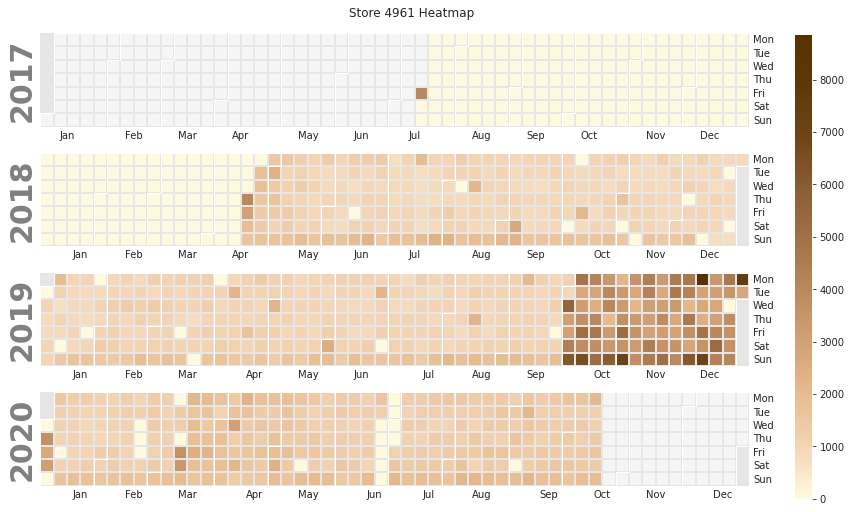

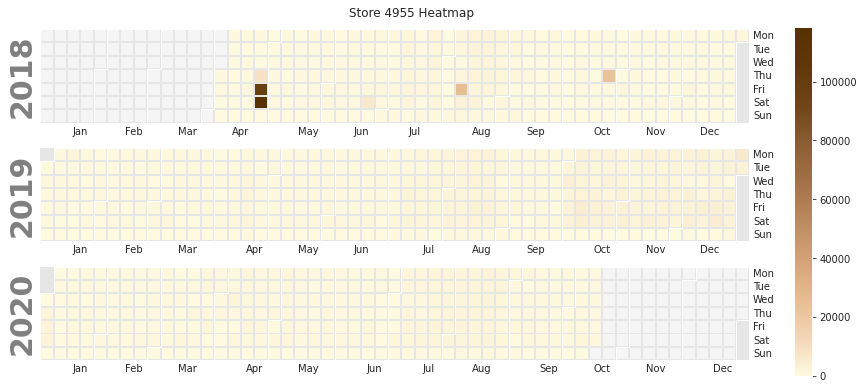

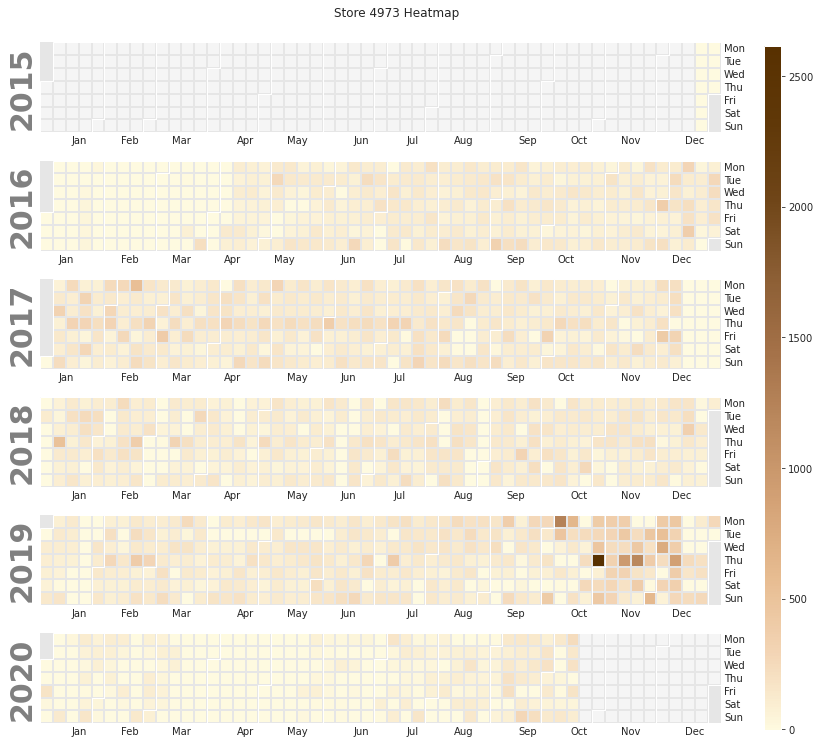

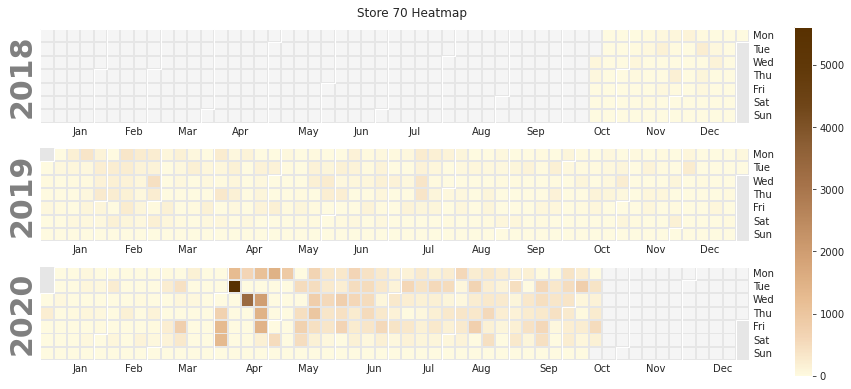

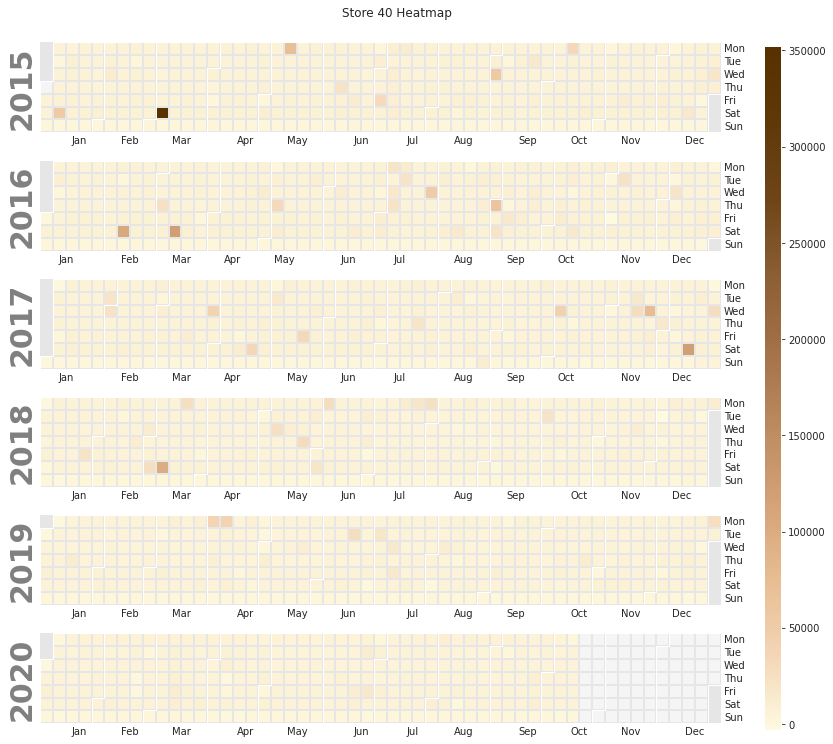

In [6]:
for value_top in top_5:
    df_tmp_top = df.loc[df['store'] == value_top].drop(columns='store')
    dtview.plot_heatmap(df_tmp_top, store=value_top)

## Visualizing the time series data points

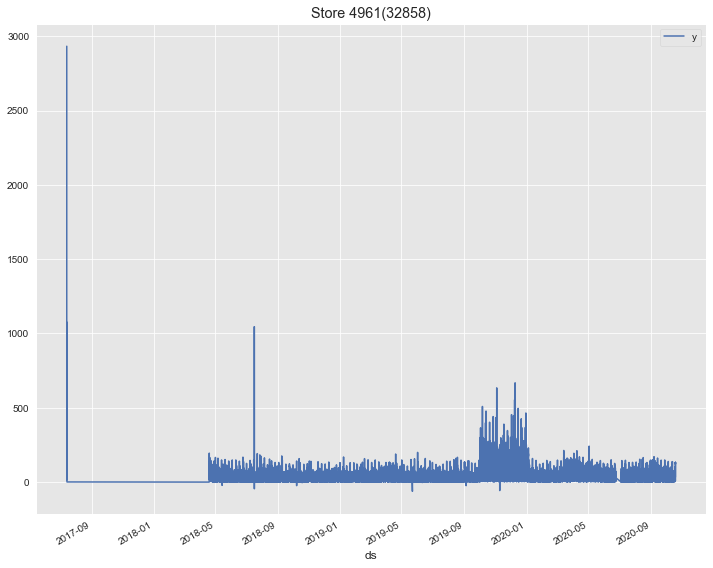

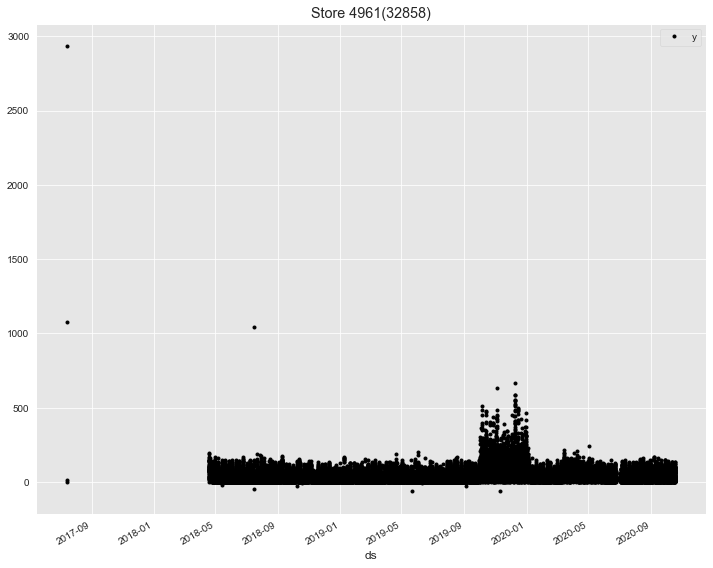

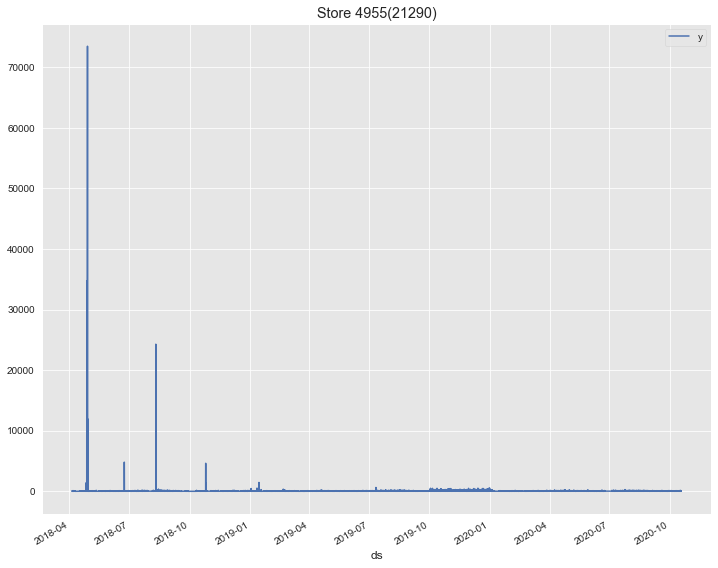

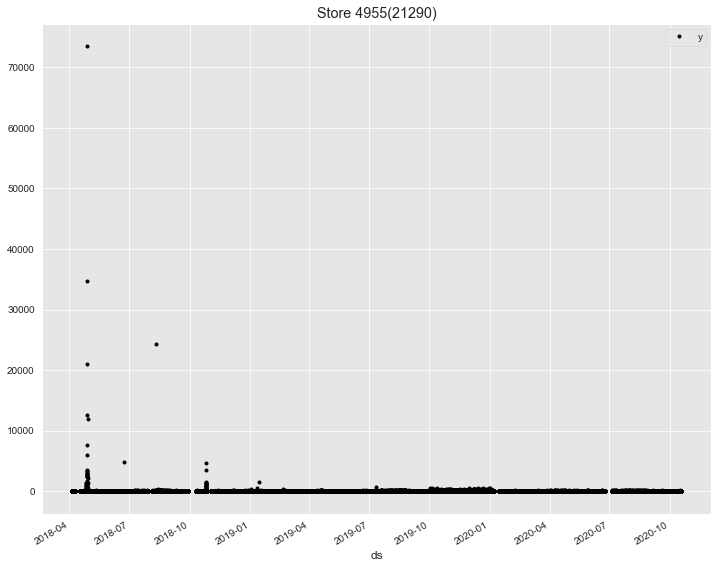

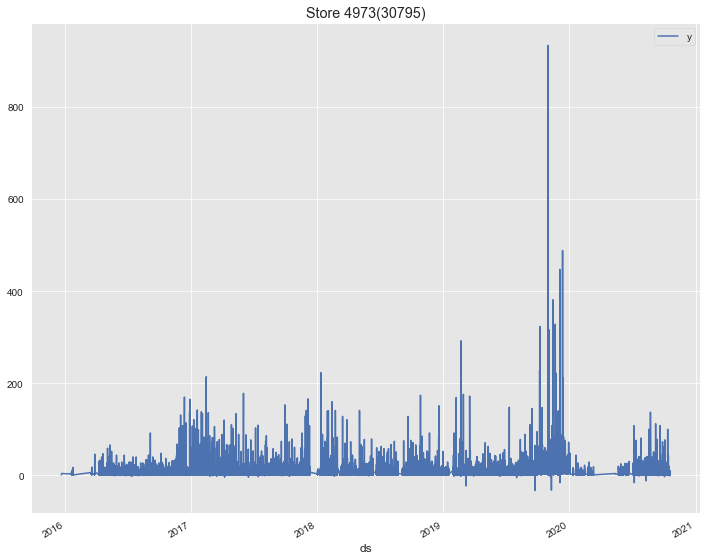

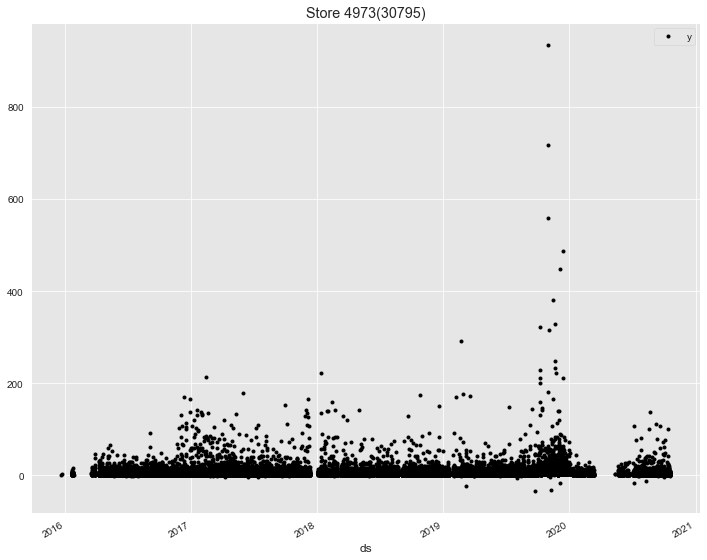

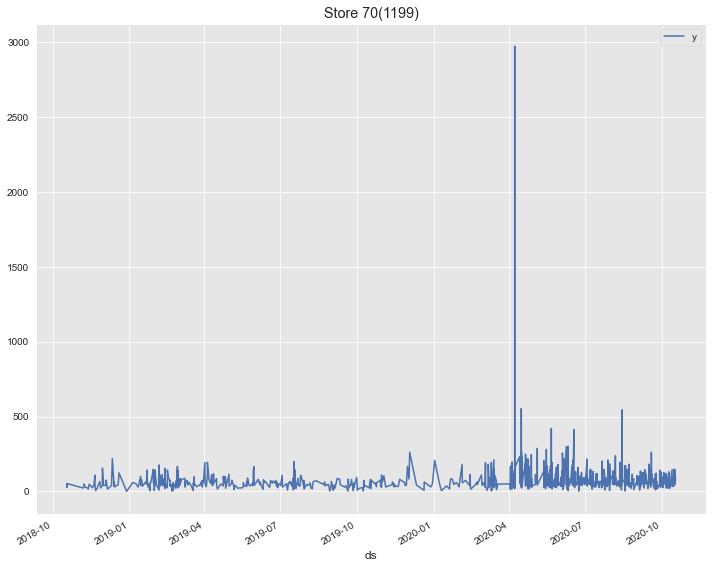

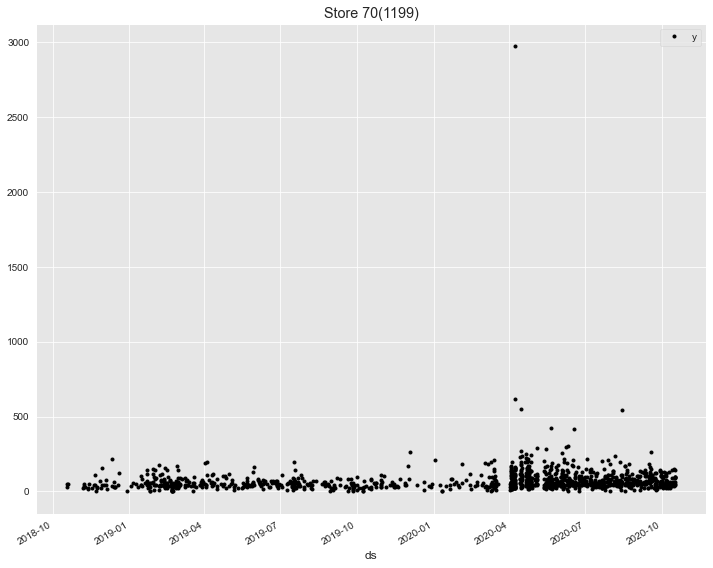

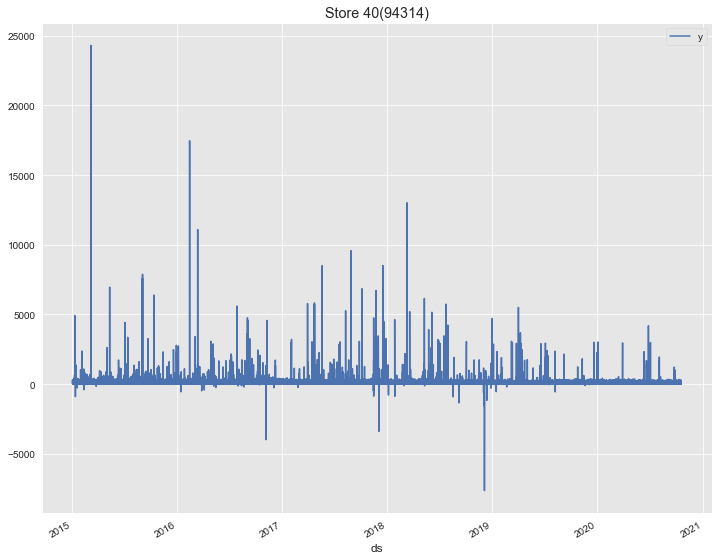

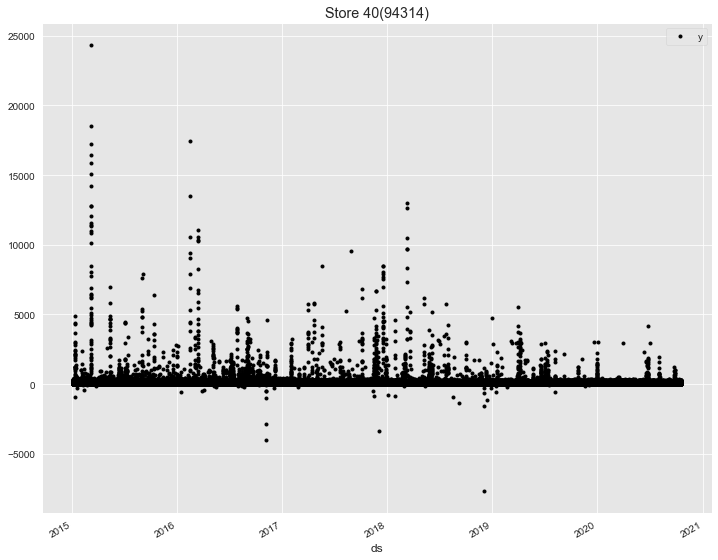

In [7]:
for value_top in top_5:
    df_tmp_top = df.loc[df['store'] == value_top].drop(columns='store')
    df_tmp_top.set_index('ds', inplace=True)
    df_tmp_top.plot(title="Store "+str(value_top) +"("+ str(df_tmp_top.size)+")", figsize=(12,10))
    df_tmp_top.plot(title="Store "+str(value_top) +"("+ str(df_tmp_top.size)+")", style='k.', figsize=(12,10))

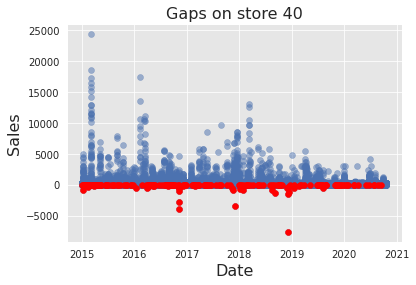

In [41]:
df_to_plot = df.loc[df['store'] == 40].drop(columns='store')
dtview.highlight_ts_dots(df_to_plot, title='Gaps on store 40', color='red')

In [44]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
df_temp = df.loc[df['store'] == 40].drop(columns='store')
df_neg = df_temp[df_temp['y'] == 0 ]
df_neg

,ds,y
2350548,2015-01-04 14:45:00,0
2353363,2015-03-09 07:30:00,0
2353988,2015-03-21 21:30:00,0
2358394,2015-06-26 21:30:00,0
2361931,2015-09-12 21:30:00,0
2370956,2016-04-03 14:30:00,0
2372544,2016-05-08 14:30:00,0
2378050,2016-09-05 21:30:00,0
2390587,2017-06-12 21:30:00,0
2392384,2017-07-21 21:30:00,0


#### Although the first 4 stores has the lowest Approximate Entropy for `r=0.2` which means a better data
#### distribution over the time series, this may be due the resample (fills gaps with zeroes) or lower volume of data.
#### The heatmap visualization and the Time Series data points visualizations, aim at store 40 with a better data
#### distribution, considering the total volume of data, number of gaps and zeroes.

### It is also interesting to find out how worst are the highest Approximate Entropy rate, which means that forecasting
### with these stores may lead to different forecasting techniques in order to get better forecasts.

## Visualizing Data distribution from the 5 worst Approximate Entropy rate (Heatmap visualization)

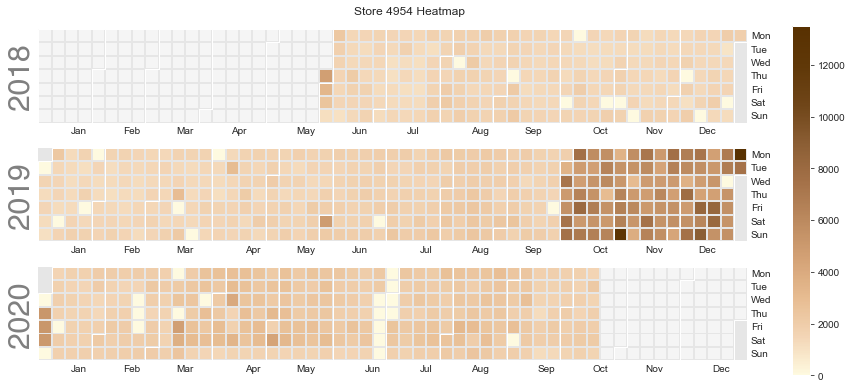

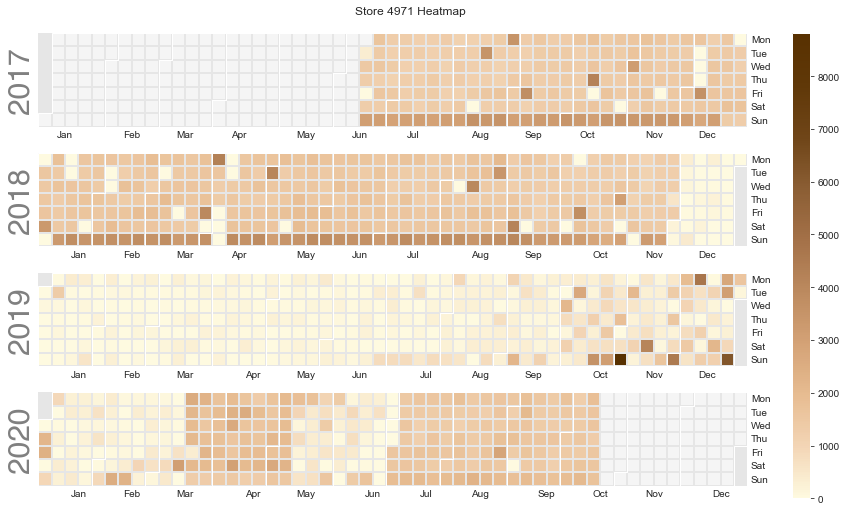

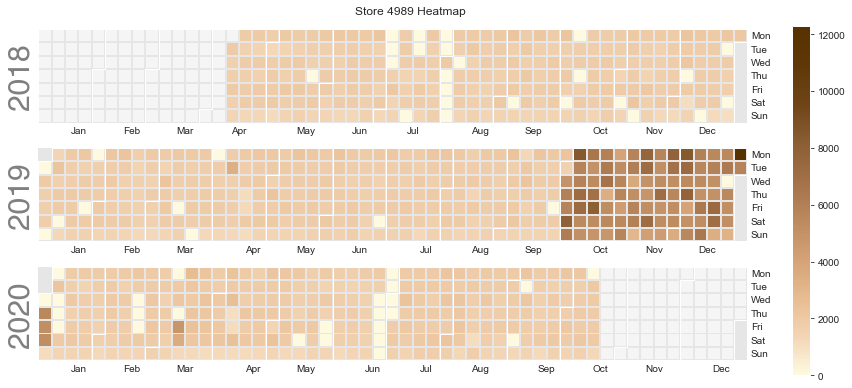

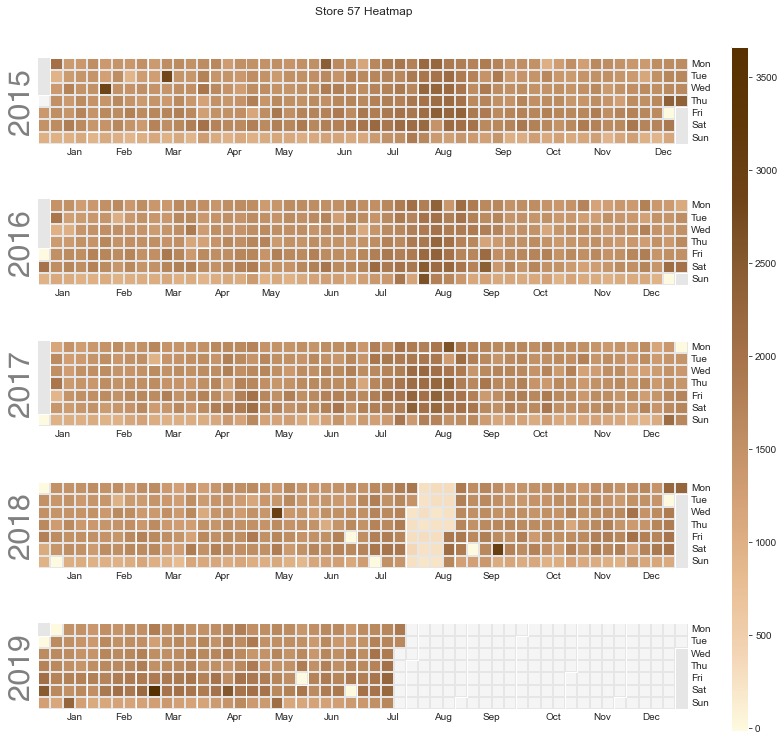

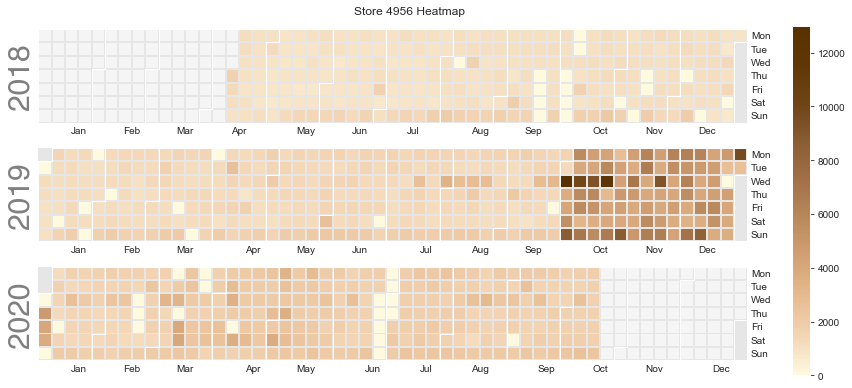

In [8]:
for value_worst in worst_5:
    df_tmp_w = df.loc[df['store'] == value_worst].drop(columns='store')
    dtview.plot_heatmap(df_tmp_w, store=value_worst)

## Visualizing the time series data points

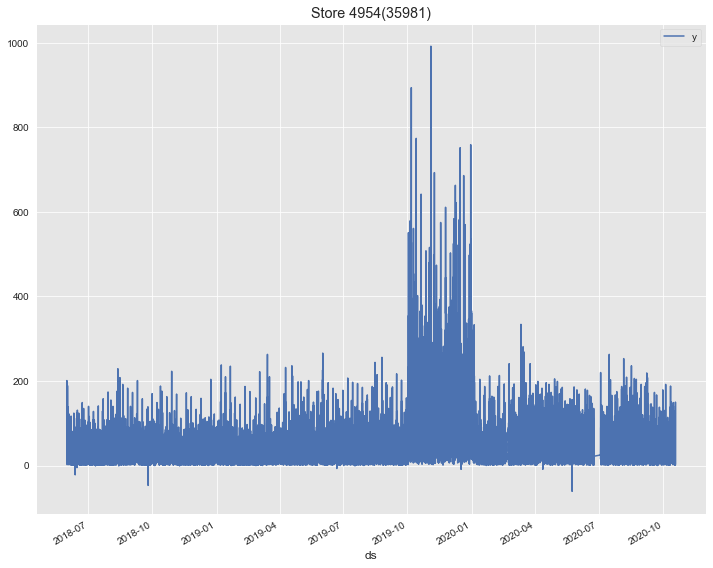

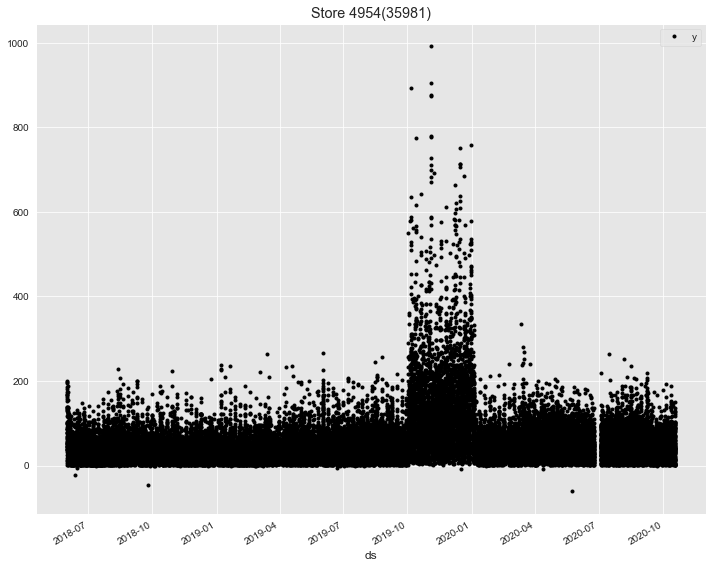

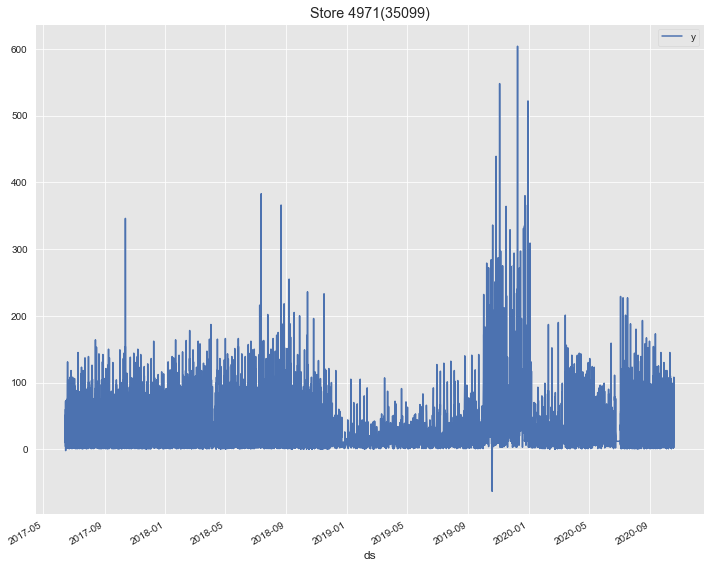

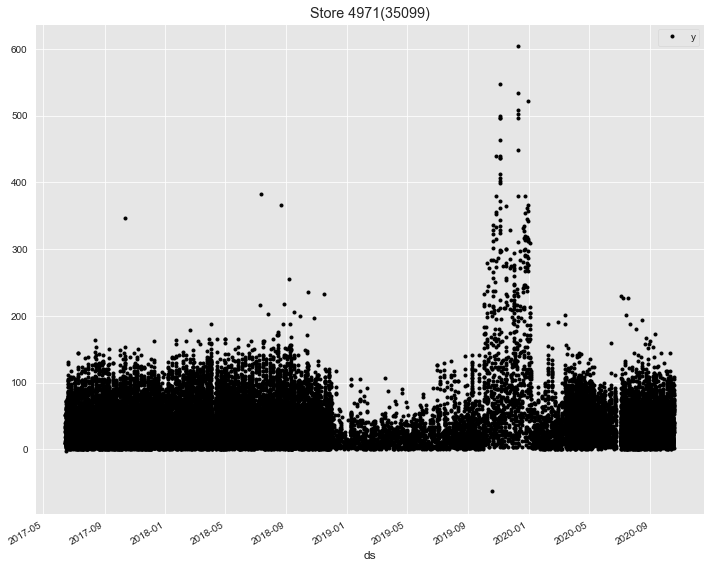

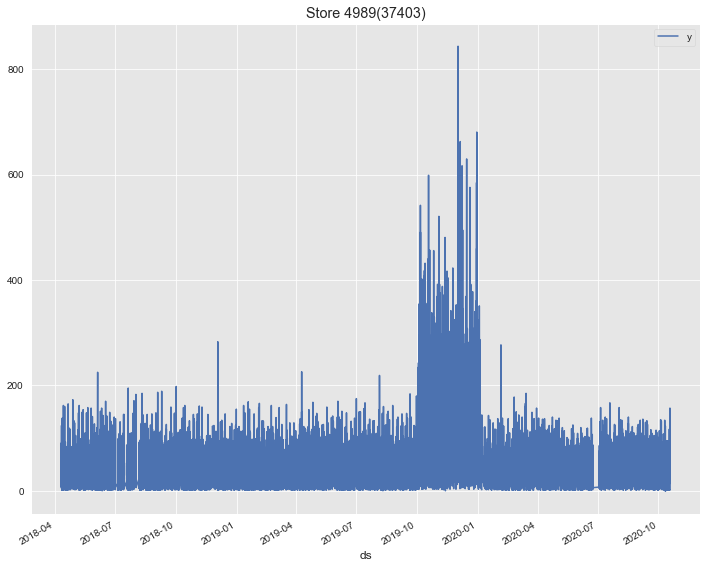

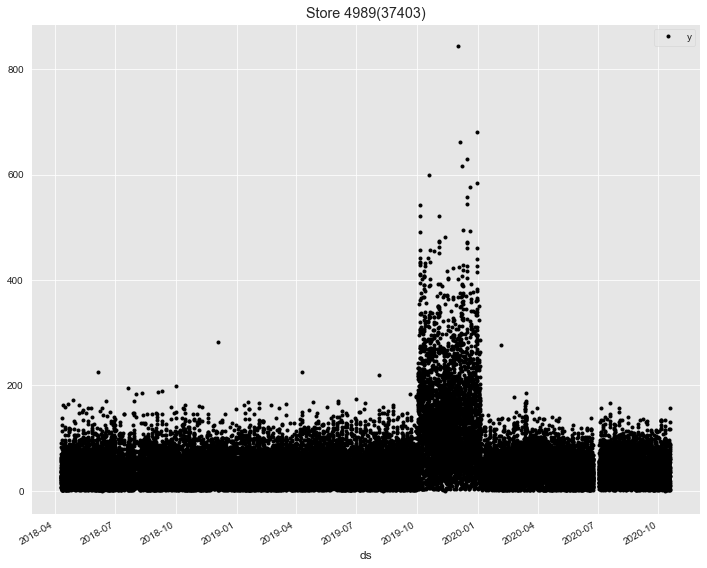

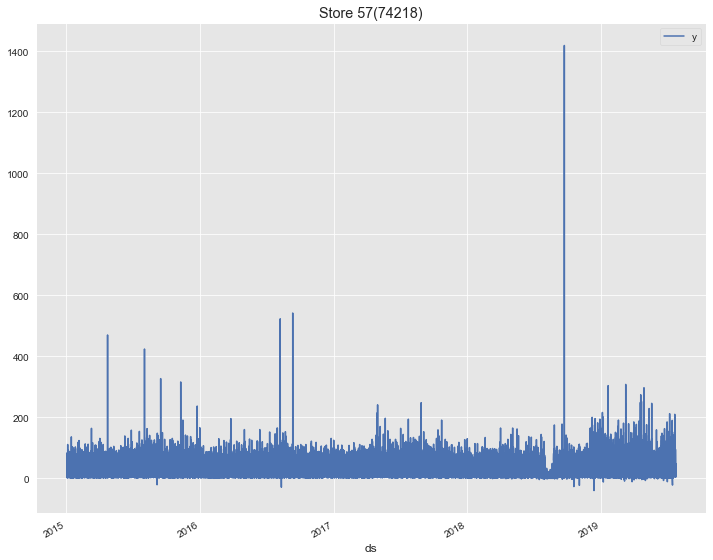

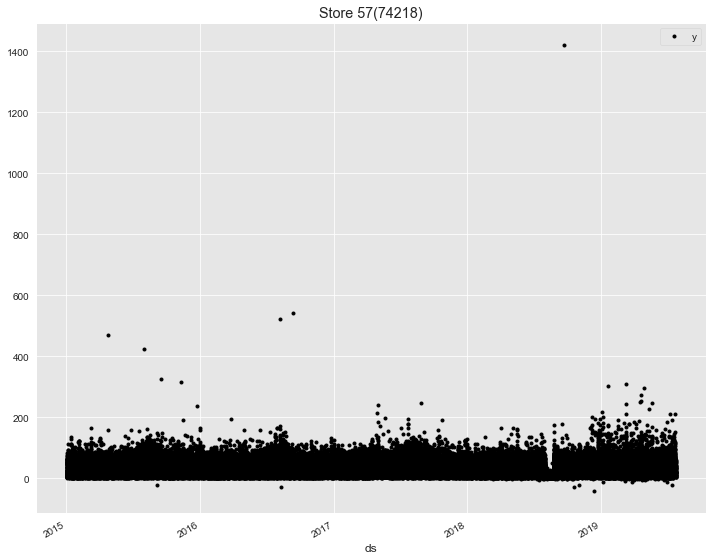

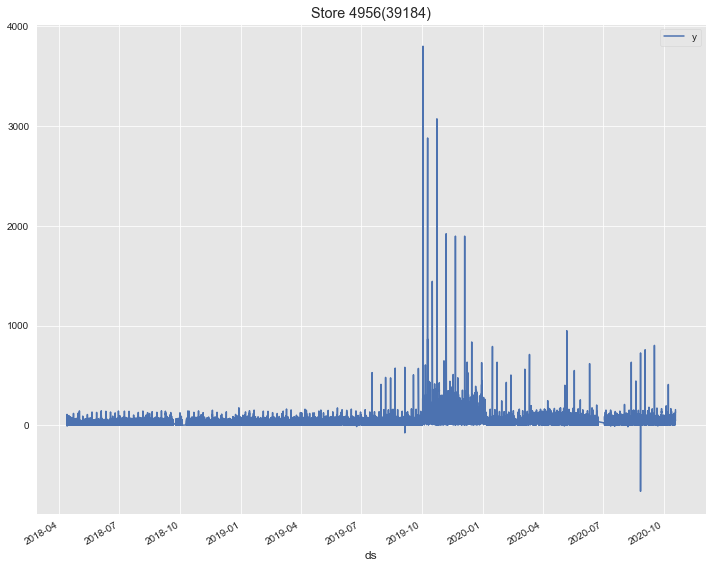

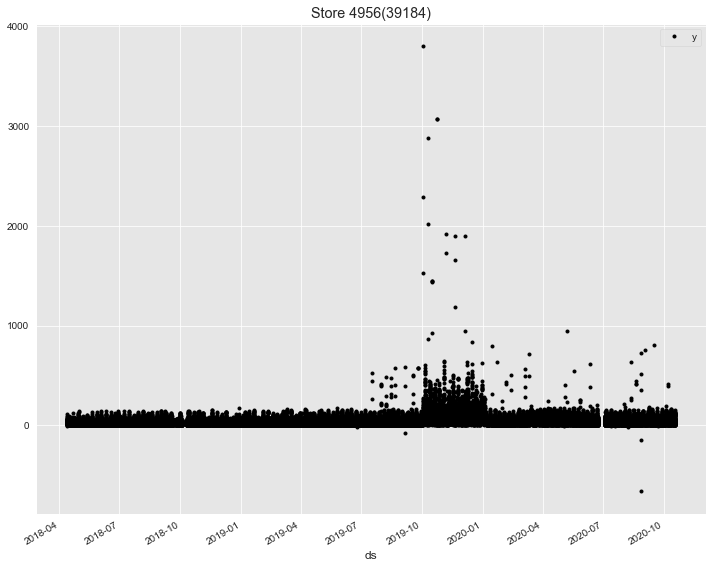

In [9]:
for value_worst in worst_5:
    df_tmp_w = df.loc[df['store'] == value_worst].drop(columns='store')
    df_tmp_w.set_index('ds', inplace=True)
    df_tmp_w.plot(title="Store "+str(value_worst) +"("+ str(df_tmp_w.size)+")", figsize=(12,10))
    df_tmp_w.plot(title="Store "+str(value_worst) +"("+ str(df_tmp_w.size)+")", style='k.', figsize=(12,10))


#### The multiple peaks and variations in the data, as can be seen in the time series data points visualization,
#### indicates that this variation added to possible anomalies and outliers, contributed to impact the time series
#### regularity, and possibly is what makes its prediction more difficult than those series with lower ApEn values.
#### Due to the above analysis, the store 40 was chosen to carry out the forecasts.

In [10]:
df_i = df.loc[df['store'] == 40]
print('store 40 without resample size: {}'.format(df_i.shape[0]))

dtview.print_dataframe_core_info(df_i)


store 40 without resample size: 94314
+-----------------------+---------------------+--------------------+
| Sales Dataframe Start | Sales Dataframe End | Data Period Range  |
+-----------------------+---------------------+--------------------+
|  2015-01-02 10:00:00  | 2020-10-18 14:30:00 | 2116 days 04:30:00 |
+-----------------------+---------------------+--------------------+


In [11]:
df_i.set_index('ds', inplace=True)
df_i = df_i.resample('30min').sum()    # 15min -> 30min
df_i.reset_index(inplace=True)
print('store 40 resampled size: {}'.format(df_i.shape[0]))
dtview.print_dataframe_core_info(df_i)

store 40 resampled size: 101578
+-----------------------+---------------------+--------------------+
| Sales Dataframe Start | Sales Dataframe End | Data Period Range  |
+-----------------------+---------------------+--------------------+
|  2015-01-02 10:00:00  | 2020-10-18 14:30:00 | 2116 days 04:30:00 |
+-----------------------+---------------------+--------------------+


## Analyzing all 121 negative values on stores to find some usefull pattern
###### Before dig into store 40, an investigation to known the data better, can be useful on further steps, starting by knowing if there are data inconsistencies.


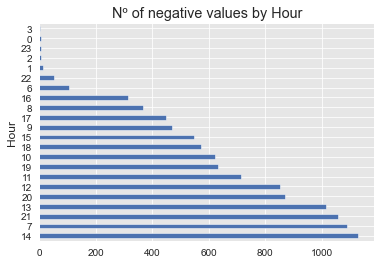

In [12]:
df = make_ds.get_dataset(table='sisqual_all', columns=['store', 'ds', 'sales'], col_to_rename='sales')
dtview.plot_negative_values(df, filename='all_negative_sales_', by_hour=True)


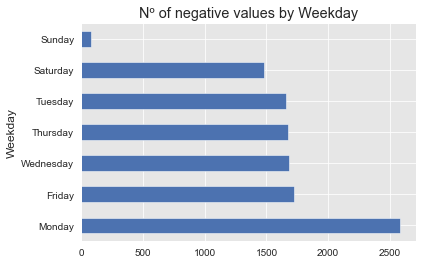

In [13]:
dtview.plot_negative_values(df, filename='all_negative_sales_', by_day=True)

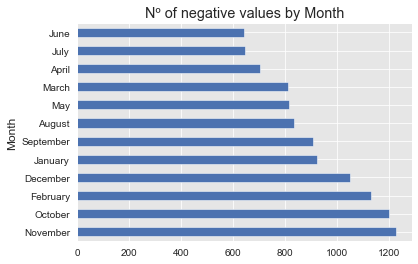

In [14]:
dtview.plot_negative_values(df, filename='all_negative_sales_', by_month=True)

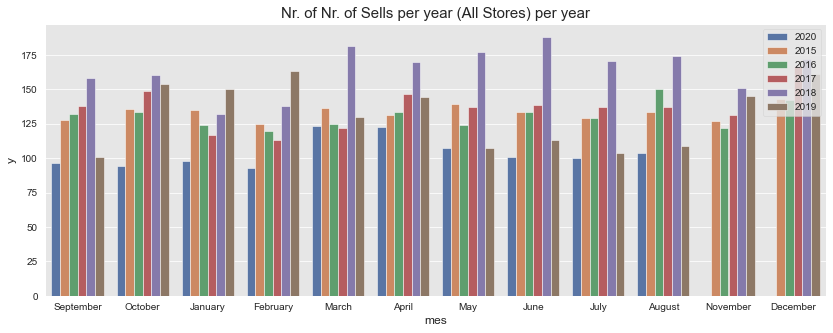

In [15]:
(dtview.plot_nr_of_y_per_year(df, "Nr. of Sells per year (All Stores)", ci=None)).show()

### Total of negative values on all 121 stores

In [16]:
df[df['y']<0]['y'].count()

10879

### Sell distribution over time (month, day, year)

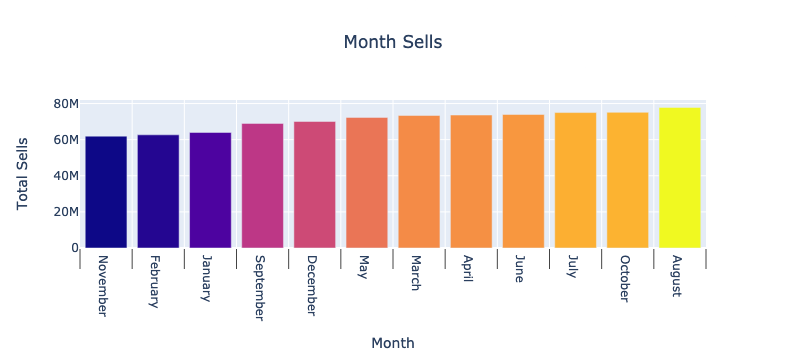

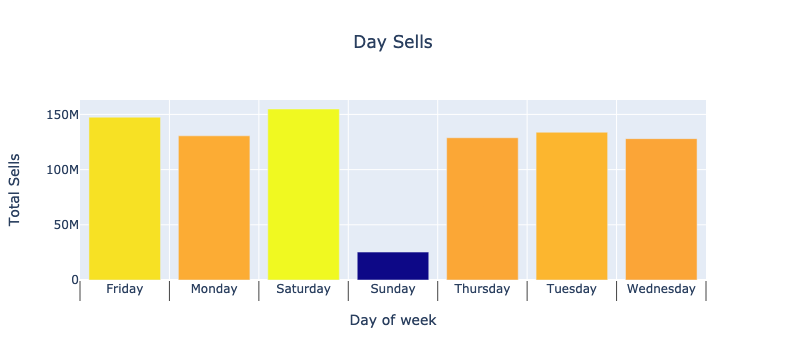

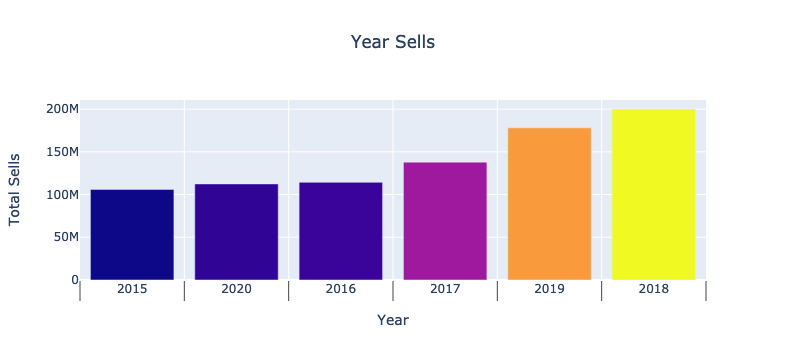

In [17]:
ano_agregado ,mes_agregado ,semana_agregado, dia_agregado = dtexp.analyze_dataframe(df)
iplot(dtview.plot_dados_agregados_semana_mes(mes_agregado,tipo_agregacao='m',xaxes_title='Month',yaxis_title='Total Sells',
                                      title='Month Sells'))

iplot(dtview.plot_dados_agregados_semana_mes(dia_agregado,tipo_agregacao='d',xaxes_title='Day of week',yaxis_title='Total Sells',
                                      title='Day Sells'))

iplot(dtview.plot_dados_agregados_semana_mes(ano_agregado,tipo_agregacao='a',xaxes_title='Year',yaxis_title='Total Sells',
                                      title='Year Sells'))

### Hour distribution (useful to guest a working hour pattern)

In [8]:
make_ds.save_processed_dataset(df, filename='all_sells_distribuicao_horas_por_dia.csv')
pd.DataFrame(df.groupby(df['ds'].dt.hour)["ds"].count()).to_csv(csvpath + '/'+'all_sells_distribuicao_horas_por_dia.csv')
df_distrib_horas= make_ds.load_processed_dataset('all_sells_distribuicao_horas_por_dia.csv')
df_distrib_horas.columns
hora=df_distrib_horas['ds'].tolist()
qtd_units=df_distrib_horas['ds.1'].tolist()
x_values=hora
y_values=qtd_units
title='Hour Distribution'
xaxes_title='Hours'
yaxis_title='Amount of data with hour'
dtview.plot_results(x_values,y_values,title=title,xaxes_title=xaxes_title,yaxis_title=yaxis_title)


200

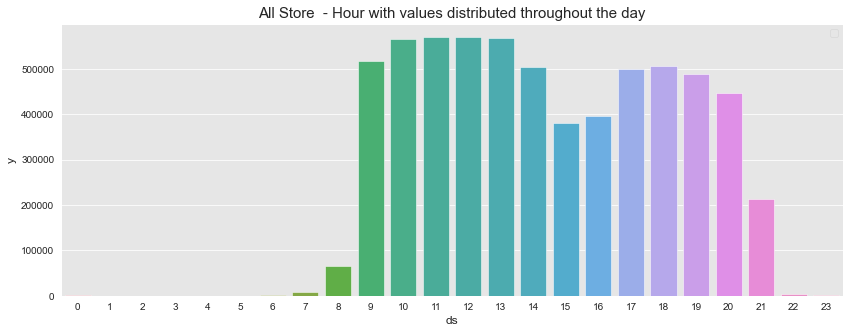

In [7]:
dtview.view_df_hours_distribution(df,'All')

###### Now we know that this dataset has 10879 of negative values and most of these negative values occurrs at 14, 7,
###### 21, 13, 20, 12, 11, 19 and 10 hours of a day. Also they appear frequently on mondays and from august to november highlight to november which has a bigger volume of negative values.
###### We know that, on average, November is the month with the lowest sales volume for the 121 stores.
###### Following are some assumptions that we can take:

+ There are some pattern on registering negative values. Oftenly they occur on mondays early in the morning, in the middle
of the day or at night, this can be interpreted as hours with a low number of clients on stores or even closed and this moment is used to make accounts corrections.
+ The negative values occur only with sales, which may represent product return and / or sales cancellation and does not
affect the quantity of client. Also it is possible to infer that without these negative values, the remain sum
acctually represent the number of products sales.
+ In November, there is a significant drop in the sales volume of all stores and this leads to the suspicion that it is
    a seasonal effect dominating or prevailing over all 121 stores.

With these assumptions the strategy to deal with negative values is simply to remove then from the dataset regardles the store location or other quirks.

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


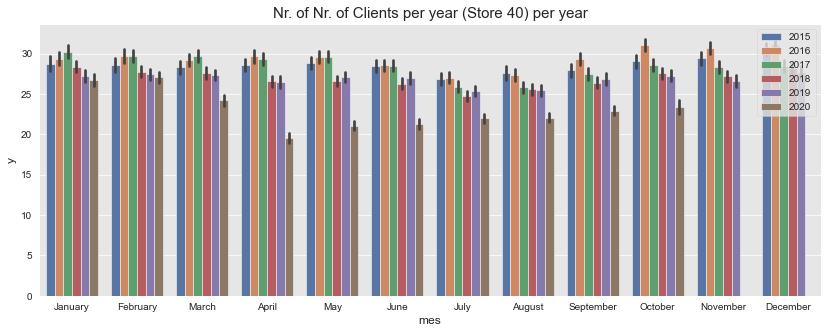

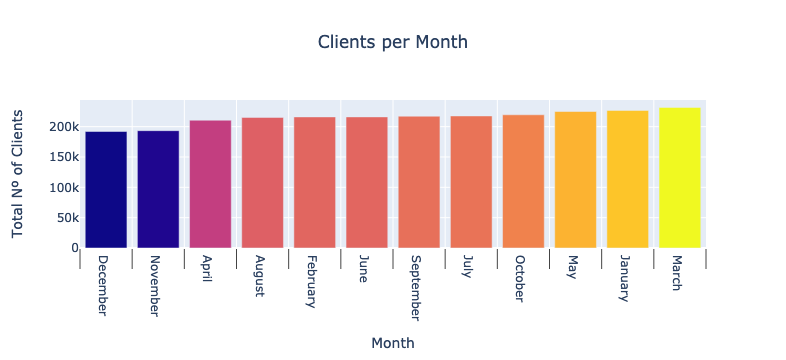

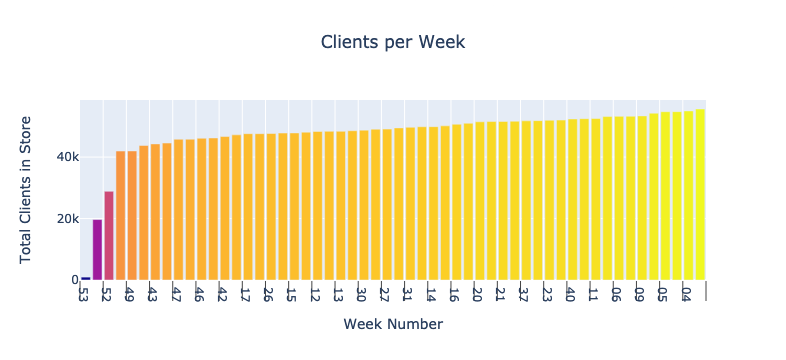

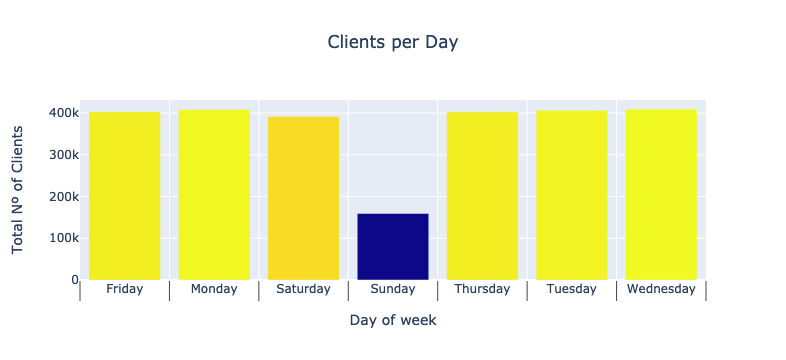

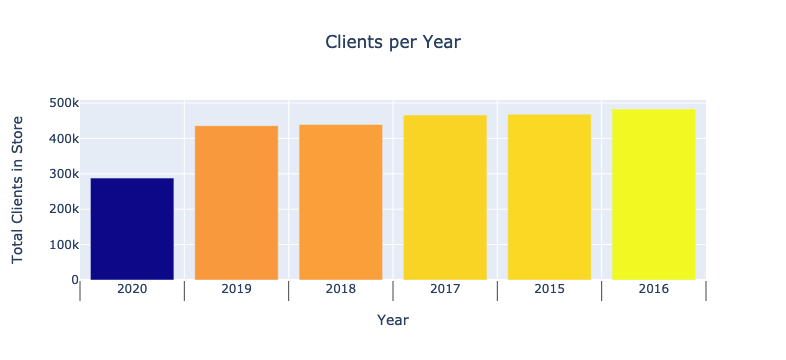

[(1, 3), (7, 121), (8, 199), (9, 7520), (10, 8352), (11, 8352), (12, 8352), (13, 8352), (14, 7830), (15, 6833), (16, 6915), (17, 6916), (18, 6919), (19, 6919), (20, 6725), (21, 3970), (22, 18), (23, 18)]


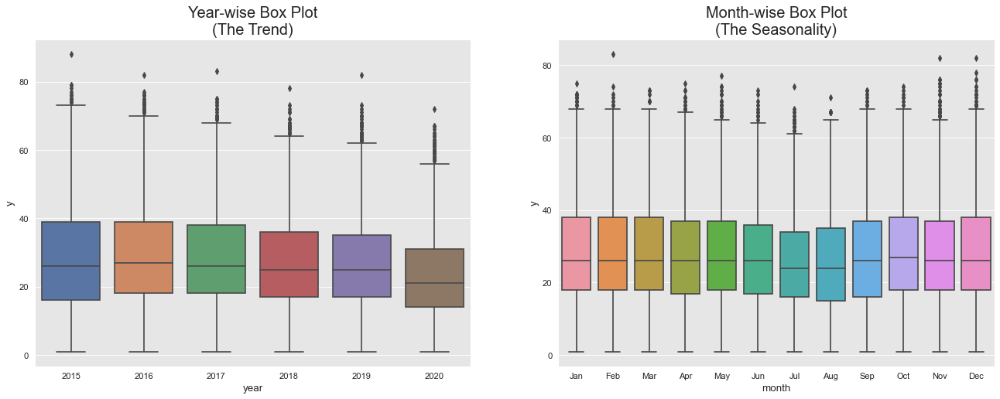

+-----------------------+---------------------+--------------------+
| Sales Dataframe Start | Sales Dataframe End | Data Period Range  |
+-----------------------+---------------------+--------------------+
|  2015-01-02 10:00:00  | 2020-10-18 14:30:00 | 2116 days 04:30:00 |
+-----------------------+---------------------+--------------------+
<class 'pandas.core.frame.DataFrame'>
Int64Index: 94314 entries, 265476 to 359789
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   index   94314 non-null  int64         
 1   store   94314 non-null  int64         
 2   ds      94314 non-null  datetime64[ns]
 3   y       94314 non-null  int64         
 4   year    94314 non-null  int64         
 5   month   94314 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 7.1+ MB
Dataframe information: None


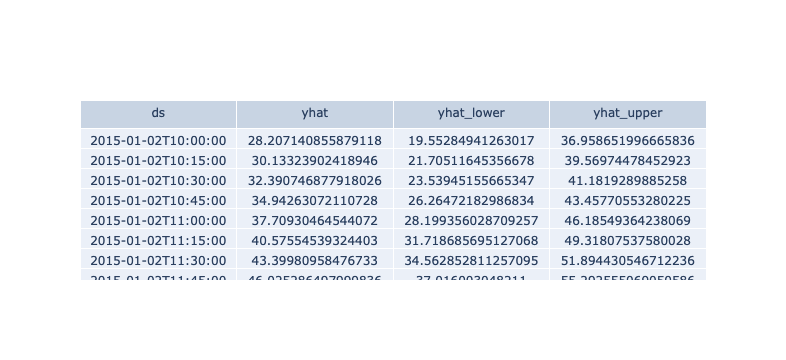

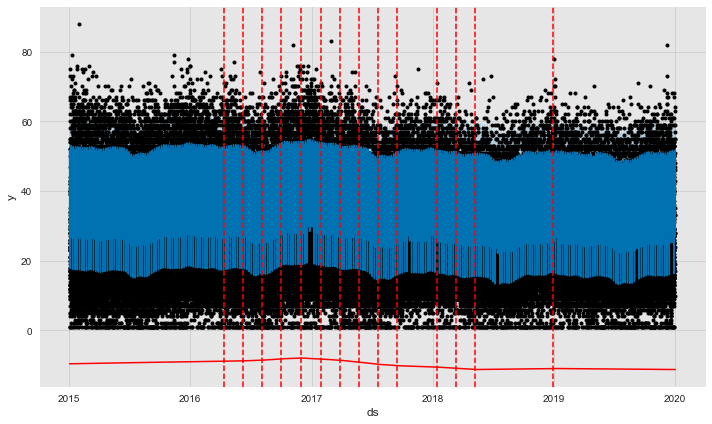

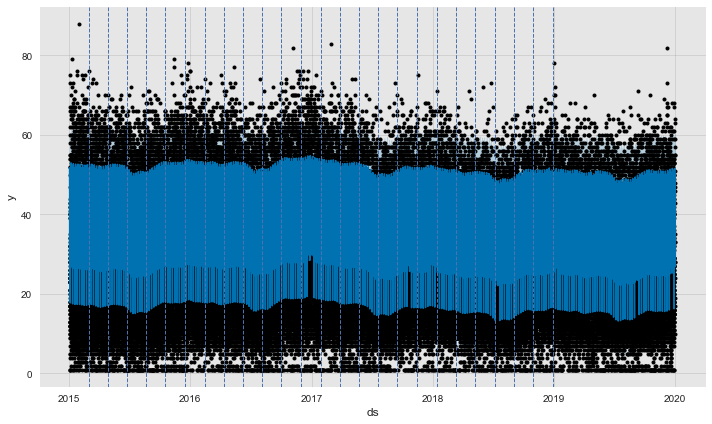

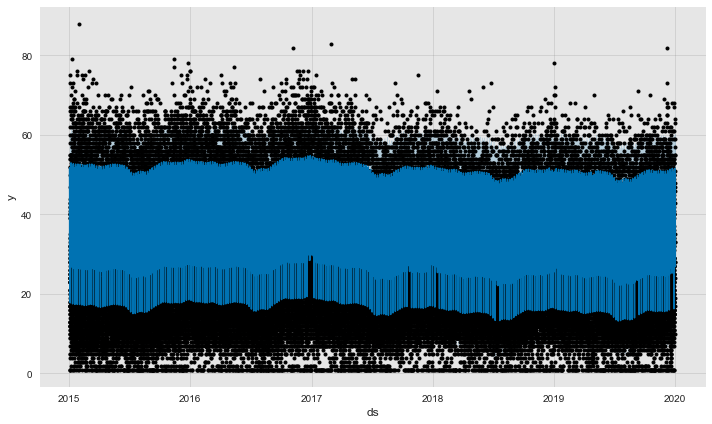

preparing to save


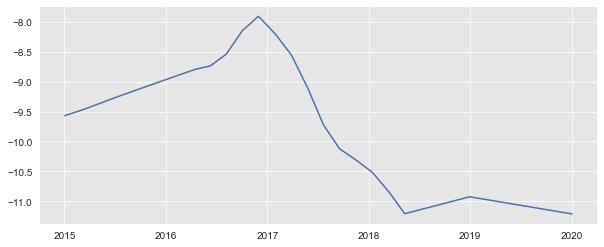

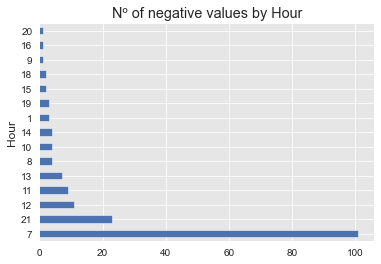

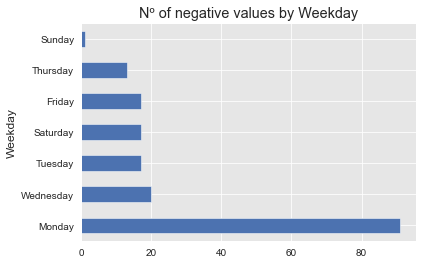

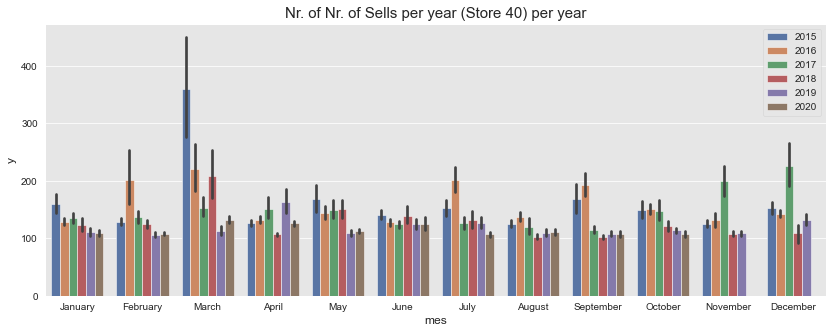

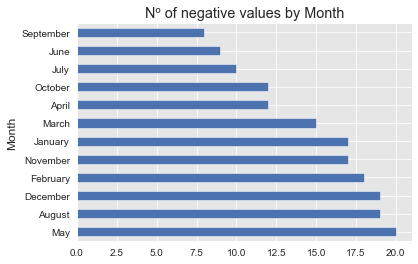

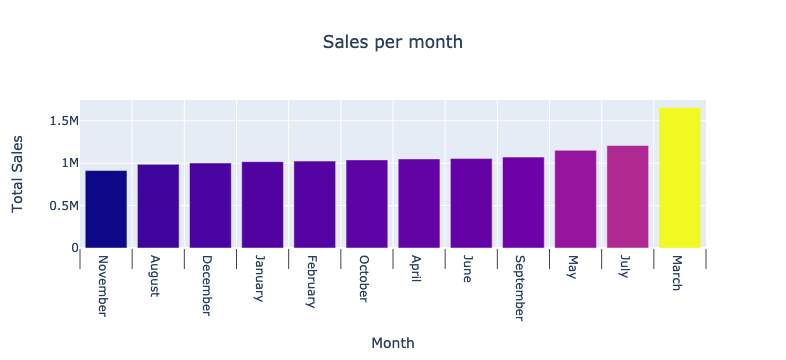

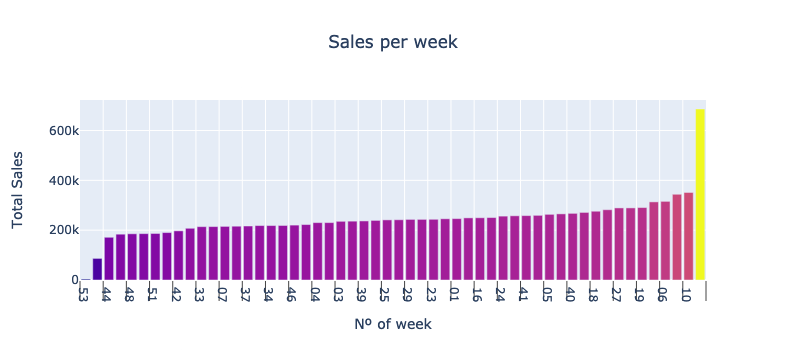

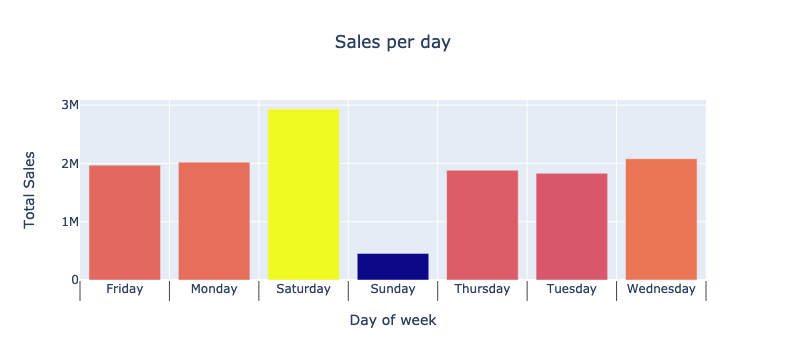

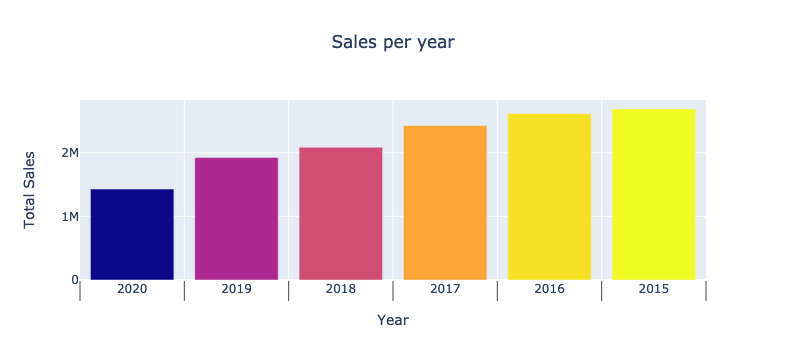

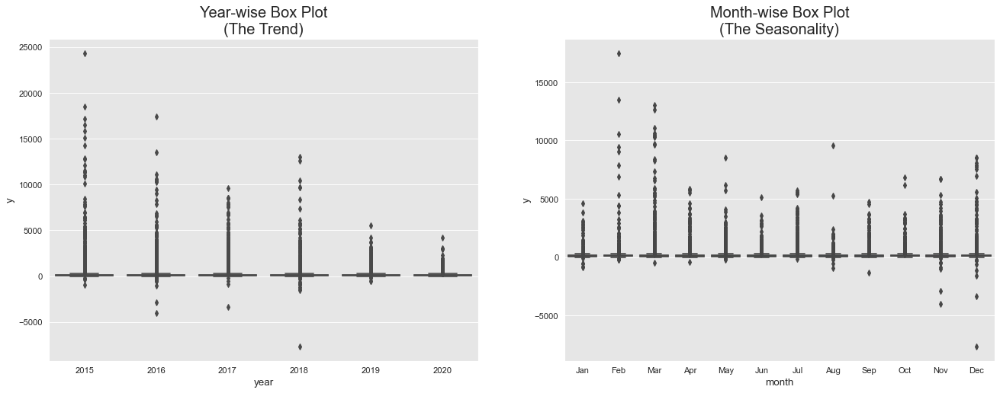

+-----------------------+---------------------+--------------------+
| Sales Dataframe Start | Sales Dataframe End | Data Period Range  |
+-----------------------+---------------------+--------------------+
|  2015-01-02 10:00:00  | 2020-10-18 14:30:00 | 2116 days 04:30:00 |
+-----------------------+---------------------+--------------------+
<class 'pandas.core.frame.DataFrame'>
Int64Index: 94314 entries, 265476 to 359789
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   index   94314 non-null  int64         
 1   store   94314 non-null  int64         
 2   ds      94314 non-null  datetime64[ns]
 3   y       94314 non-null  int64         
 4   year    94314 non-null  int64         
 5   month   94314 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 7.1+ MB
Dataframe information: None


In [ ]:
%run "0.1-cnaj-sisqual-store-40-data-analysis.ipynb"
